Install spleeter-gpu. All the dependencies will get automatically installed once the following command is run. (You need to restart the runtime on colab)

In [1]:
!pip install spleeter-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 20.1 MB 1.3 MB/s 
     |████████████████████████████████| 10.5 MB 60.1 MB/s 
     |████████████████████████████████| 26.1 MB 1.4 MB/s 
     |████████████████████████████████| 183 kB 67.8 MB/s 
     |████████████████████████████████| 320.4 MB 52 kB/s 
     |████████████████████████████████| 2.9 MB 50.0 MB/s 
     |████████████████████████████████| 459 kB 67.6 MB/s 
  Created wheel for spleeter-gpu: filename=spleeter_gpu-2.0.2-py3-none-any.whl size=49755 sha256=3f39291d4bccc466447fd30a74c12db4ce789b680ccd9e3963284f1c3398a088
  Stored in directory: /root/.cache/pip/wheels/2d/c1/fa/c164c944f55c2616acf8ceae34bc9703305a5c5b52d2a1df07
  Created wheel for librosa: filename=librosa-0.8.0-py3-none-any.whl size=201396 sha256=61f3c832afa2d8d899ff2b0678c3c067bb6ec1cce1b75f7ce37dd2d86bf3672c
  Stored in directory: /root/.cache/pip/wheels/de/1e/aa/d91797ae7e1ce118

Install the latest version of gdown to download large files as well as folders from Google Drive.

In [1]:
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for gdown: filename=gdown-4.5.1-py3-none-any.whl size=14951 sha256=4d0fea9e8704aed57bee99c7eff4f58fe895f1f14db553f7b96b2bea0d65311c
  Stored in directory: /tmp/pip-ephem-wheel-cache-3rgrmyfz/wheels/3d/ec/b0/a96d1d126183f98570a785e6bf8789fca559853a9260e928e1
Successfully built gdown
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


In [2]:
!nvidia-smi

Sun Jul 31 12:49:35 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Clone this repository.

In [3]:
!git clone https://github.com/orcasound/acoustic-separation.git

Cloning into 'acoustic-separation'...
remote: Enumerating objects: 372, done.
remote: Counting objects: 100% (105/105), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 372 (delta 36), reused 62 (delta 29), pack-reused 267
Receiving objects: 100% (372/372), 176.52 MiB | 17.54 MiB/s, done.
Resolving deltas: 100% (92/92), done.
Checking out files: 100% (170/170), done.


In [4]:
cd acoustic-separation/

/content/acoustic-separation


Download the fine-tuned Spleeter model.

In [5]:
!gdown --folder 1gelfLsfEKIleFxqXAtZMNUznDseNLzOQ

Retrieving folder list
Retrieving folder 1f199K8JLj0jxsE8L54CGyTT5gtXUzqNn eval
Processing file 1wbnnflE9qHKj1gmAn9SYXXoUap6fSc0m events.out.tfevents.1658215136.b97ecd271cdc
Processing file 1S8v6bcVw0Tb3FrcANM4LoQEjDnNlFgtQ ._checkpoint
Processing file 1KDsTAmgS5WAWJr2KBlZCgIdTJh-MYlrM ._model.ckpt-1000000.data-00000-of-00001
Processing file 1dbJxxzTm0X4rW2BEPfbHgQbOkha5F46Q ._model.ckpt-1000000.index
Processing file 1wAOh-hiWFr4Jokb2YWo2oiu-2DdsqBpk ._model.ckpt-1000000.meta
Processing file 1Jgs79eyztLrApFED0wi40lJBjaH6jpP7 .probe
Processing file 1pc1_9pQ5ykHVlgKJWVzsewu_mtUYlDNy checkpoint
Processing file 1Rlot_vM-Up7k9YKYQFc_6xbOcMU3nxn2 events.out.tfevents.1658214944.b97ecd271cdc
Processing file 1KkmawVldLo_eNZmKEhyVMs6gKqQ3t3-x graph.pbtxt
Processing file 1o3eqUtm2AsOJDsTXSmEVX8H0brnKpWqY model.ckpt-1030000.data-00000-of-00001
Processing file 1zDBxBRFgNUu5QicLBIH-2vKGZeTJybuR model.ckpt-1030000.index
Processing file 1KyB7djKwblTQE5ev6sE8wXBKs6I2iazB model.ckpt-1030000.meta
Process

In [6]:
ls

 2stems-finetune/          Orca_background.jpeg   screencapture.mp4
 data/                     Plots/                 spleeterfunc/
 lightning_logs/           processing.py          transforms.py
 MATLAB_filtered_audios/   __pycache__/           trial.m
'Model comparison'/        README.md              zeroshot/


Import necessary modules.

In [7]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import display, Audio
from spleeterfunc.spleeter_separator import Separator

/usr/local/lib/python3.7/dist-packages/resampy/interpn.py:114: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  _resample_loop_p(x, t_out, interp_win, interp_delta, num_table, scale, y)


While loading an audio file. make sure to set the sample rate as 44100.

In [8]:
y, fs = librosa.load('data/OS_9_27_2017_08_25_00__0002.wav', sr=44100)

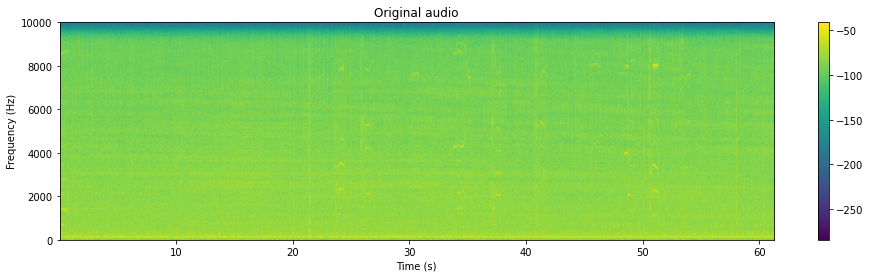

In [9]:
plt.figure(figsize=(16,4))
plt.specgram(y, NFFT=1024, Fs=fs)
plt.axis(ymin=0, ymax=10000)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar()
plt.title('Original audio')
plt.show()
display(Audio(data=y,rate=44100))

If you save the model checkpoint and the parameter file somewhere else, you have to change the following variables. 'SPLEETER_MODEL_PARAMS' contains the location of the json file containing model paramters. 'SPLEETER_MODEL' contains the name of the directory where the model checkpoint is present

In [10]:
SPLEETER_MODEL_PARAMS = 'spleeterfunc/2stems-finetune.json'
SPLEETER_MODEL = '2stems-finetune'

In [11]:
model = Separator(params_descriptor=SPLEETER_MODEL_PARAMS, model_path=SPLEETER_MODEL)

In [12]:
waveform = y.reshape((y.shape[0], 1)).astype(np.float32)
orca_vocals = model.return_source_dictionary(waveform, 44100)['orca_vocals']
# The model returns the output waveform in stereo format (containing 2 channels). But both the channels contain same data so we can drop one.
orca_vocals = orca_vocals[:,1]

using tensorflow
INFO:tensorflow:Using config: {'_model_dir': '2stems-finetune', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': gpu_options {
  per_process_gpu_memory_fraction: 0.7
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Apply unet for orca_vocals_spectrogram
INFO:tensorflow:Apply unet for noise_spectrogram
INFO:tensorflow:Done calling model_fn.
INFO:tensor

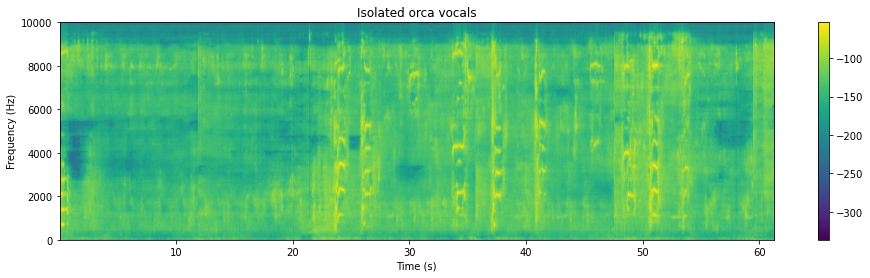

In [13]:
plt.figure(figsize=(16,4))
plt.specgram(orca_vocals, NFFT=1024, Fs=fs)
plt.axis(ymin=0, ymax=10000)

plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar()
plt.title('Isolated orca vocals')
plt.show()
display(Audio(data=orca_vocals,rate=44100))